In [1]:
%load_ext autoreload
%autoreload 2

import io
from itertools import combinations
from PIL import Image
import os
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
from result_manager.result_manager import ResultManager
from oads_access.oads_access import OADS_Access, add_label_boxes_to_axis
from oads_access.utils import get_random_crops, get_bin_values, imscatter, imscatter_all, plot_images
import numpy as np
from lgnpy.CEandSC.lgn_statistics import lgn_statistics, get_edge_maps, LGN
from lgnpy.run_LGNstatistics import loadmat
from scipy.stats import binned_statistic_2d
import torch
import multiprocessing
import tqdm
from matplotlib.colors import LinearSegmentedColormap

In [2]:
basedir = '/home/niklas/projects/data/oads'
image_names = os.listdir(os.path.join(basedir, 'oads_arw', 'tiff'))

# image_names = [image_name for image_name in image_names if os.path.exists(f'/home/niklas/projects/lgnpy/cache/results_{image_name}.npy')]

number_crops_per_image = 30
crop_size = (1920, 1080)

threshold_lgn = loadmat('/home/niklas/projects/lgnpy/ThresholdLGN.mat')
threshold_lgn = threshold_lgn['ThresholdLGN']

result_manager = ResultManager(root='/home/niklas/projects/oads_access/results')

results = result_manager.load_result('lgn_statistics.pkl')

Could not load mat file with mat73 - trying to load with scipy.io.loadmat!


In [3]:
ce_results = results['CE']
sc_results = results['SC']
beta_results = results['Beta']
gamma_results = results['Gamma']
filenames = results['filenames']
crop_indices = results['crop_indices']
crop_boxes = results['crop_boxes']
jpeg_factors = results['jpeg_factors']
crop_jpeg_factors = results['crop_jpeg_factors']

# Pick sample image

In [85]:
# random images
rng = np.random.default_rng()

In [86]:
images = []
# indices = rng.choice(range(len(filenames)), 10)
indices = [0, 4315]
for index in indices:
    if os.path.exists(os.path.join(basedir, 'oads_arw', 'tiff', filenames[index])):
        images.append(Image.open(os.path.join(basedir, 'oads_arw', 'tiff', filenames[index])))

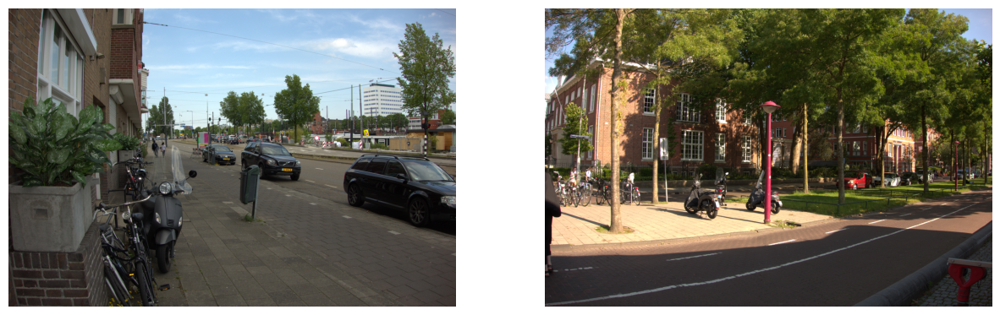

In [87]:
fig = plot_images(images)

In [ ]:
images[1]

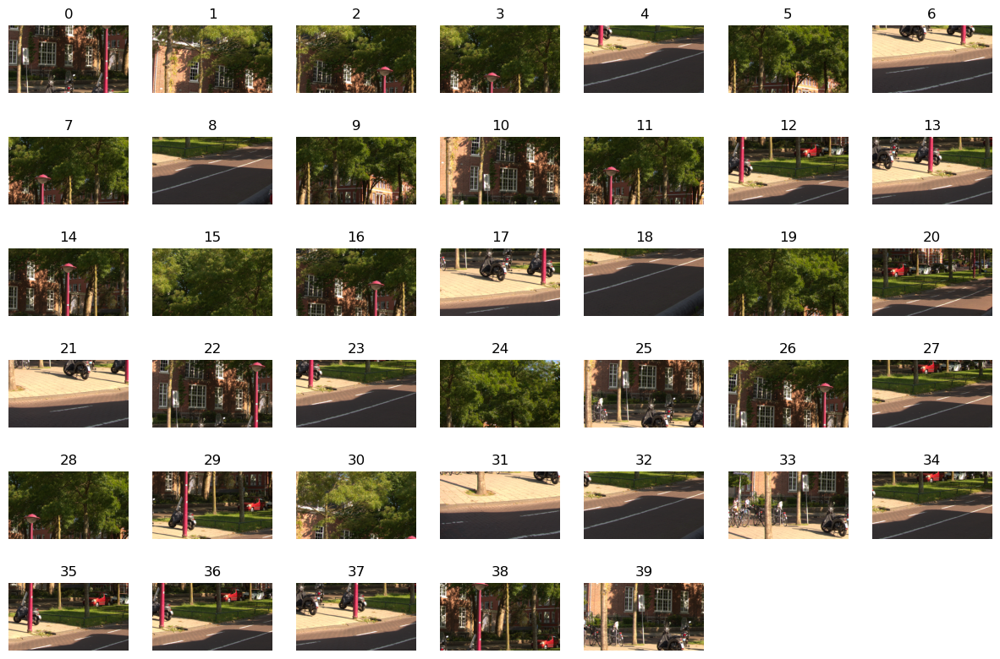

In [89]:
# get the crop
index = 1
img = images[index]
crops = []
titles = []
for box in crop_boxes[index]:
    crop = img.crop(box)
    crops.append(crop)

fig = plot_images(crops, titles=range(len(crops)))

In [90]:
crop_index = 24

# img.crop(crop_boxes[index][crop_index])

In [91]:
# get ce/sc
ce_crops = np.array([np.mean(_x[:,i,0]) for _x in ce_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
sc_crops = np.array([np.mean(_x[:,i,0]) for _x in sc_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
ce_peri_crops = np.array([np.mean(_x[:,i,1]) for _x in ce_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
sc_peri_crops = np.array([np.mean(_x[:,i,1]) for _x in sc_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)

In [109]:
oads_natural_sc = sc_results[index,:,:,0]
oads_natural_ce = ce_results[index,:,:,0]

In [93]:
indices[index]

4315

# Find an image that has a similar SC/CE in the eeg_jneurosc13 dataset

In [94]:
use_oads = False
reduce = False
reduce_factor = 1
jn_ce = np.load(f'/home/niklas/projects/eeg_jneurosc13/results/ce_{"oads" if use_oads else "test"}{"_reduced_" + str(reduce_factor) if reduce else ""}_allstim.npy')
jn_sc = np.load(f'/home/niklas/projects/eeg_jneurosc13/results/sc_{"oads" if use_oads else "test"}{"_reduced_" + str(reduce_factor) if reduce else ""}_allstim.npy')
jn_filenames = []
with open(f'/home/niklas/projects/eeg_jneurosc13/results/filename_{"oads" if use_oads else "test"}{"_reduced_" + str(reduce_factor) if reduce else ""}_allstim.txt', "r") as f:
    # jn_filenames = f.readlines()
    for line in f.readlines():
        jn_filenames.append(line[:-1])
        # filenames.append(f"im_{str(int(line[:-1])+1).zfill(4)}.jpg")

center_ce = np.mean(jn_ce[:,:,0,:], axis=1)[:,0]
peri_ce = np.mean(jn_ce[:,:,0,:], axis=1)[:,1]

center_sc = np.mean(jn_sc[:,:,0,:], axis=1)[:,0]
peri_sc = np.mean(jn_sc[:,:,0,:], axis=1)[:,1]


In [95]:
print(jn_sc.shape)
c=0
jn_images = []
for k in range(len(jn_sc)):
    if np.allclose([oads_natural_sc[:]], [jn_sc[k,:,0,0]], rtol=0.09):
        print(jn_sc[k,:,0,0], oads_natural_sc[:])
        jn_images.append(Image.open(os.path.join('/home/niklas/projects/eeg_jneurosc13/allstim/', jn_filenames[k])))

(1600, 3, 1, 2)
[0.95426967 1.11580488 1.28454108] [0.89376739 1.07455001 1.39101929]
[0.82505201 1.03135236 1.27677373] [0.89376739 1.07455001 1.39101929]
[0.95352358 1.10765297 1.38887823] [0.89376739 1.07455001 1.39101929]
[0.92809936 1.15616025 1.35038301] [0.89376739 1.07455001 1.39101929]
[0.94747075 1.0427012  1.28847343] [0.89376739 1.07455001 1.39101929]
[0.84465776 1.14063023 1.28684418] [0.89376739 1.07455001 1.39101929]
[0.92403527 1.08628224 1.34085637] [0.89376739 1.07455001 1.39101929]
[0.94603319 1.04592718 1.32597922] [0.89376739 1.07455001 1.39101929]


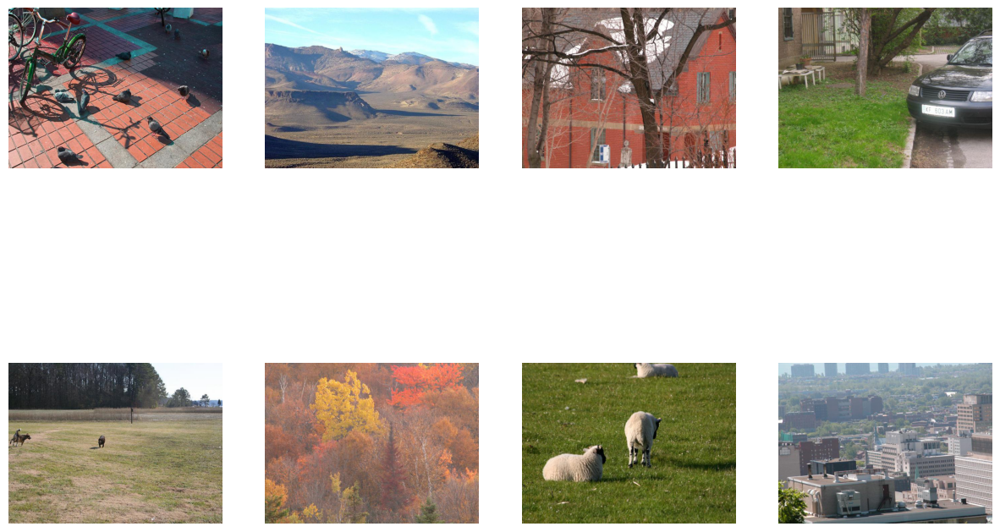

In [96]:
fig = plot_images(jn_images)

In [97]:
# Find images that look the same
sc_threshold = (1.5, 1.8)
ce_threshold = (0.007, 0.009)
high_sc_jn_images = []
titles = []
for k in range(len(jn_sc)):
    if jn_sc[k,0,0,0] > sc_threshold[0] and jn_sc[k,0,0,0] < sc_threshold[1] and jn_ce[k,0,0,0] > ce_threshold[0] and jn_ce[k,0,0,0] < ce_threshold[1]:
        print(k)
        titles.append(f'sc: {jn_sc[k,0,0,0]:.2f}, ce: {jn_ce[k,0,0,0]:.2f}, k: {k}')
        high_sc_jn_images.append(Image.open(os.path.join('/home/niklas/projects/eeg_jneurosc13/allstim/', jn_filenames[k])))

46
119
120
132
174
244
268
335
462
465
475
487
535
584
645
731
777
802
896
954
974
1001
1003
1035
1218
1256
1336
1385
1440
1554


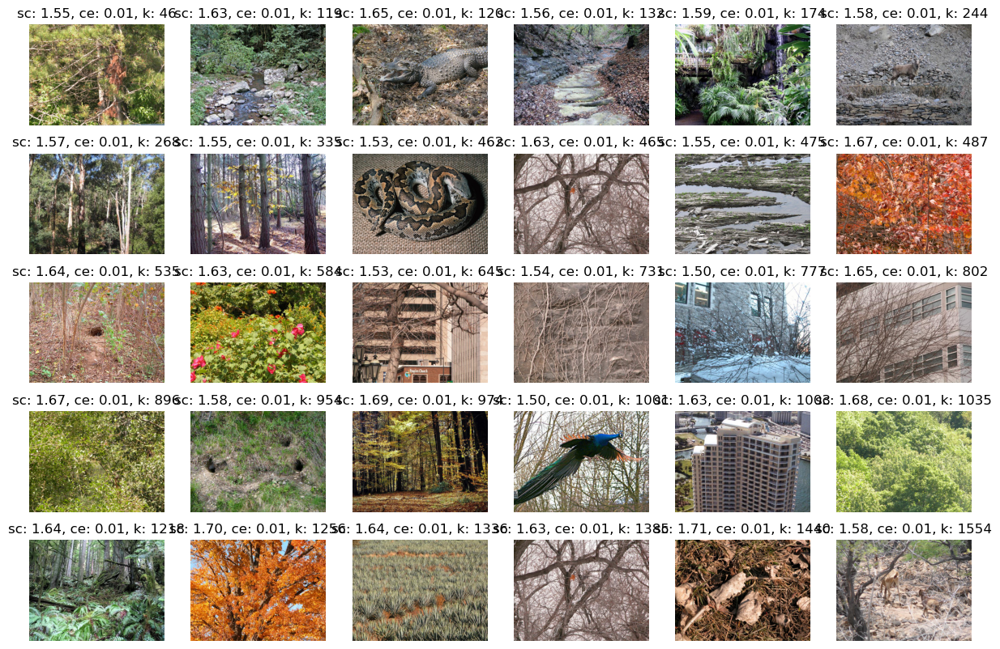

In [98]:
fig = plot_images(high_sc_jn_images, titles=titles)

In [127]:
len(crop_boxes[index])

40

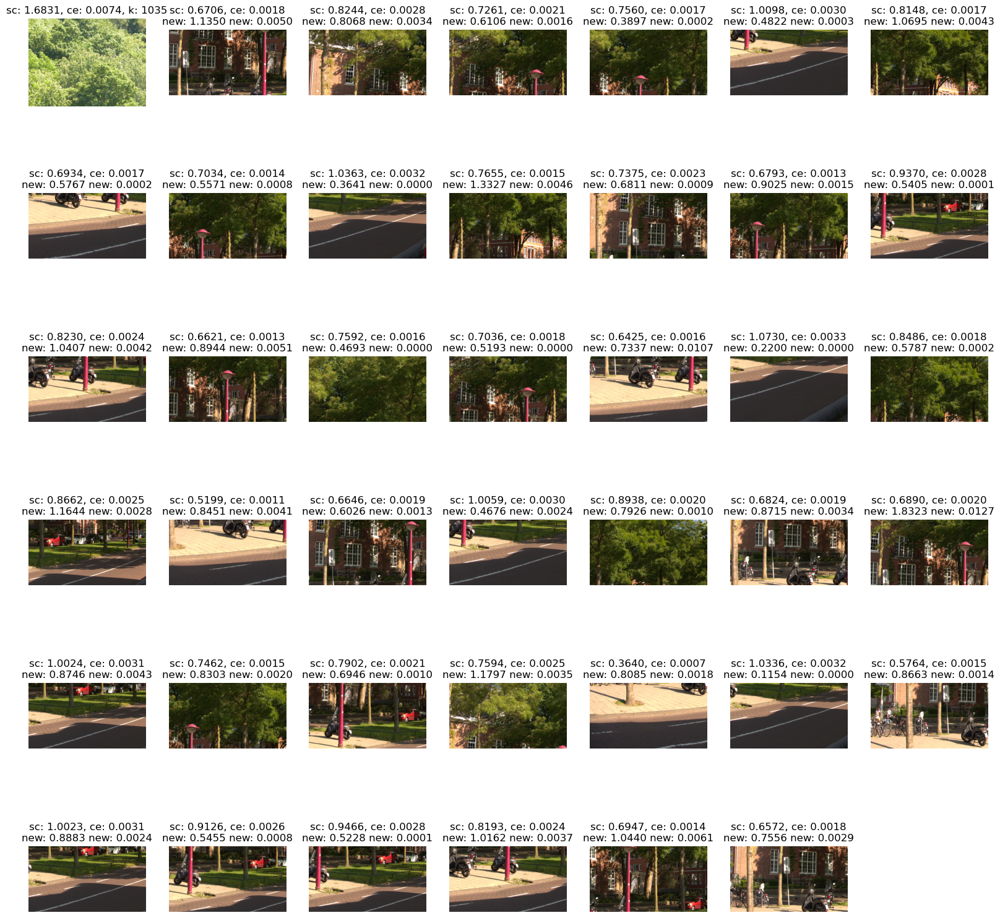

In [232]:
k = 1035
comp_images = [Image.open(os.path.join('/home/niklas/projects/eeg_jneurosc13/allstim/', jn_filenames[k]))]
titles = [f'sc: {jn_sc[k,0,0,0]:.4f}, ce: {jn_ce[k,0,0,0]:.4f}, k: {k}']
for c_index in range(1, len(ce_new[0,:,0])):
    comp_images.append(img.crop(crop_boxes[index][c_index-1]))
    titles.append(f'sc: {oads_natural_sc[0][c_index]:.4f}, ce: {oads_natural_ce[0][c_index]:.4f}\nnew: {sc_new[0,c_index,0]:.4f} new: {ce_new[0,c_index,0]:.4f}')
fig = plot_images(comp_images, titles=titles, figsize=(20,20))
# print(sc_new[0,1,0], ce_new[0,1,0])

# Load edgemaps

In [23]:
jn_edgemap = np.load(os.path.join('/home/niklas/projects/lgnpy/cache/', f'results_{jn_filenames[k]}.npz'))
oads_edgemap = np.load(os.path.join('/home/niklas/projects/lgnpy/cache/', f'results_{filenames[indices[index]]}.npz'))

In [24]:
jn_par1, jn_par2, jn_par3, jn_mag1, jn_mag2, jn_mag3 = jn_edgemap['par1'], jn_edgemap['par2'], jn_edgemap['par3'], jn_edgemap['mag1'], jn_edgemap['mag2'], jn_edgemap['mag3']
oads_par1, oads_par2, oads_par3, oads_mag1, oads_mag2, oads_mag3 = oads_edgemap['par1'], oads_edgemap['par2'], oads_edgemap['par3'], oads_edgemap['mag1'], oads_edgemap['mag2'], oads_edgemap['mag3']

(3672, 5496)


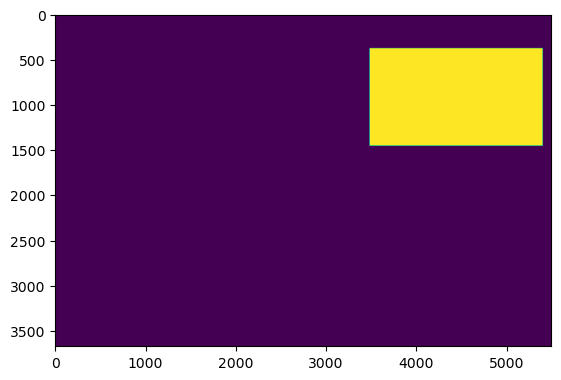

In [51]:
box = crop_boxes[index][crop_index]
mask = np.zeros(np.array(img).shape[:2], dtype=np.bool8)
mask[box[1]:box[3], box[0]:box[2]] = True
# mask = mask[::8,::8]
fig, ax = plt.subplots()
ax.imshow(mask)
print(mask.shape)

In [29]:
from lgnpy.CEandSC.lgn_statistics import LGN
lgn = LGN(config=config, default_config_path='/home/niklas/projects/lgnpy/lgnpy/CEandSC/default_config.yml')

In [33]:
imsize = np.array(img).shape[:2]
imsize = mask_imsize
#######################################################
# Set parameters for field of view
#######################################################
# viewing_dist = lgn.get_attr('viewing_dist')
viewing_dist = 0.5

dot_pitch = lgn.get_attr('dot_pitch')
fov_beta = lgn.get_attr('fov_beta')
fov_gamma = lgn.get_attr('fov_gamma')

fovx = round(imsize[1]/2)          # x-pixel loc. of fovea center
fovy = round(imsize[0]/2)          # y-pixel loc. of fovea center
# ex and ey are the x- and y- offsets of each pixel compared to
# the point of focus (fovx,fovy) in pixels.
ex, ey = np.meshgrid(np.arange(start=-fovx+1, stop=imsize[1]-fovx+1),
                    np.arange(start=-fovy+1, stop=imsize[0]-fovy+1))
# eradius is the radial distance between each point and the point
# of gaze.  This is in meters.
eradius = dot_pitch * np.sqrt(ex**2+ey**2)
del ex, ey
# calculate ec, the eccentricity from the foveal center, for each
# point in the image.  ec is in degrees.
ec = 180*np.arctan(eradius / viewing_dist)/np.pi
# select the pixels that fall within the input visual field of view
imfovbeta = (ec < fov_beta)
imfovgamma = (ec < fov_gamma)

In [31]:
_x = mask.sum(axis=0)
mask_height = _x[_x > 0][0]
_x = mask.sum(axis=1)
mask_width = _x[_x > 0][0]
mask_imsize = (mask_height, mask_width)

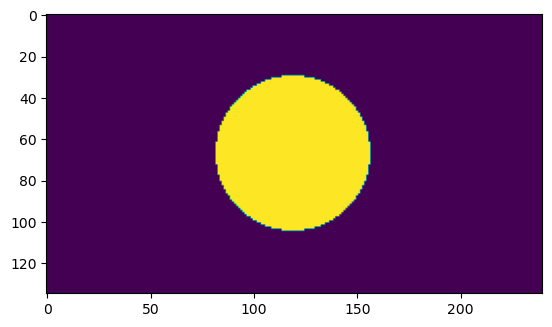

In [34]:
fig, ax = plt.subplots()
ax.imshow(imfovbeta)

# print(mask.sum(axis=0))
# ax.imshow(mask)

In [ ]:
# oads_mag1.shape, mask.shape, img.reduce(8).size, oads_par1[mask].reshape((211, 135))

In [ ]:
(10,) + imfovbeta.shape

(10, 1080, 1920)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 459 but corresponding boolean dimension is 3672

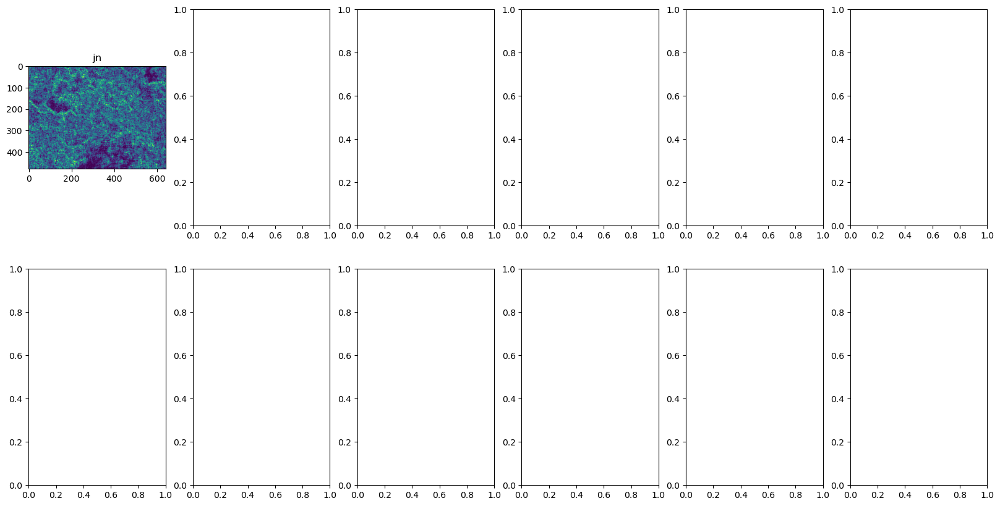

In [52]:
fig, ax = plt.subplots(2, 6, figsize=(20,10))

ax[0, 0].imshow(jn_par1)
ax[0, 0].set_title('jn')
ax[1, 0].imshow(oads_par1[mask].reshape((135, 240)))
ax[1, 0].set_title(f'oads, sc: {np.mean(oads_par1[mask])/np.std(oads_par1[mask]):.4f}')
ax[0, 1].imshow(jn_par2)
ax[0, 1].set_title('jn')
ax[1, 1].imshow(oads_par2[mask].reshape((135, 240)))
ax[1, 1].set_title(f'oads, sc: {np.mean(oads_par2[mask])/np.std(oads_par2[mask]):.4f}')
ax[0, 2].imshow(jn_par3)
ax[0, 2].set_title('jn')
ax[1, 2].imshow(oads_par3[mask].reshape((135, 240)))
ax[1, 2].set_title(f'oads, sc: {np.mean(oads_par3[mask])/np.std(oads_par3[mask]):.4f}')
ax[0, 3].imshow(jn_mag1)
ax[0, 3].set_title('jn')
ax[1, 3].imshow(oads_mag1[mask].reshape((135, 240)))
ax[1, 3].set_title(f'oads, sc: {np.mean(oads_mag1[mask])/np.std(oads_mag1[mask]):.4f}')
ax[0, 4].imshow(jn_mag2)
ax[0, 4].set_title('jn')
ax[1, 4].imshow(oads_mag2[mask].reshape((135, 240)))
ax[1, 4].set_title(f'oads, sc: {np.mean(oads_mag2[mask])/np.std(oads_mag2[mask]):.4f}')
ax[0, 5].imshow(jn_mag3)
ax[0, 5].set_title('jn')
ax[1, 5].imshow(oads_mag3[mask].reshape((135, 240)))
ax[1, 5].set_title(f'oads, sc: {np.mean(oads_mag3[mask])/np.std(oads_mag3[mask]):.4f}')

In [ ]:
oads_par1

# Redo SC/CE

In [231]:
from lgnpy.CEandSC.lgn_statistics import lgn_statistics
config = {'parvo_sigmas': np.array([48*4, 24*4, 12*4, 6*4, 3*4, 6, 3]), 'magno_sigmas': np.array([64*4, 32*4, 16*4, 8*4, 4*4, 8, 4])}
box = crop_boxes[index][crop_index]
crop_masks = []
for box in crop_boxes[index]:
    mask = np.zeros(np.array(img).shape[:2], dtype=np.bool8)
    mask[box[1]:box[3], box[0]:box[2]] = True
    # crop_masks = [mask]
    crop_masks.append(mask)

ce_new, sc_new, _, _ = lgn_statistics(im=np.array(img), file_name=filenames[indices[index]], config=config, threshold_lgn=threshold_lgn, force_recompute=True, cache=False, 
                                            crop_masks=crop_masks, compute_extra_statistics=True)

Computing LGN statistics for 670685b69683828c.tiff


In [113]:
sc_new.shape

(3, 41, 2)

# Check bigger sigmas

In [7]:
img = Image.open(os.path.join(basedir, "oads_arw", 'tiff', image_names[0]))

In [77]:
configs = [{'parvo_sigmas': np.array([48, 24, 12, 6, 3]), 'magno_sigmas': np.array([64, 32, 16, 8, 4])}, {'parvo_sigmas': np.array([48, 24, 12, 6, 3]), 'magno_sigmas': np.array([64, 32, 16, 8, 4])}]

In [78]:
configs

[{'parvo_sigmas': array([48, 24, 12,  6,  3]),
  'magno_sigmas': array([64, 32, 16,  8,  4])},
 {'parvo_sigmas': array([48, 24, 12,  6,  3]),
  'magno_sigmas': array([64, 32, 16,  8,  4])}]

In [79]:
from lgnpy.CEandSC.lgn_statistics import lgn_statistics
results = []

for c_index, config in enumerate(configs):
    if c_index > 0:
        config['parvo_sigmas'] *= 4
        config['magno_sigmas'] *= 4
    res = lgn_statistics(im=np.array(img), file_name=image_names[0], config=config, threshold_lgn=threshold_lgn, force_recompute=True, cache=False, 
                                            crop_masks=[], compute_extra_statistics=False)
    results.append(res)

Computing LGN statistics for ddddded9dfce7bb6.tiff
Computing LGN statistics for ddddded9dfce7bb6.tiff


In [80]:
print(f'ce: {results[0][0][:,0,0]}, sc: {results[0][1][:,0,0]}')
print(f'ce: {results[1][0][:,0,0]}, sc: {results[1][1][:,0,0]}')

ce: [0.00067998 0.00046502 0.00061562], sc: [0.59712455 0.80857035 0.78837573]
ce: [7.79582812e-05 2.21569604e-05 2.77199080e-05], sc: [0.81062984 0.87254036 0.86814912]


In [ ]:
img

In [163]:
from scipy.interpolate import interp1d
interpolation_sigmas = np.array([1, 2, 4, 8, 16, 32]) * 8

In [25]:
from lgnpy.CEandSC.lgn_statistics import LGN
lgn = LGN(config=configs[0], default_config_path='/home/niklas/projects/lgnpy/lgnpy/CEandSC/default_config.yml')

In [227]:
sigma = np.array(configs[0]['parvo_sigmas'])[3] * 8
sigma

48

In [228]:
sigmas = np.array(interpolation_sigmas)
v1 = np.squeeze(threshold_lgn[:, 0])
t1_interp = interp1d(sigmas, v1, kind='linear',
                    bounds_error=False, fill_value=np.nan)
t1 = t1_interp(sigma)
v2 = np.squeeze(threshold_lgn[:, 1])
t2_interp = interp1d(sigmas, v2, kind='linear',
                    bounds_error=False, fill_value=np.nan)
t2 = t2_interp(sigma)
v3 = np.squeeze(threshold_lgn[:, 2])
t3_interp = interp1d(sigmas, v3, kind='linear',
                    bounds_error=False, fill_value=np.nan)
t3 = t3_interp(sigma)

print(t1,t2,t3)

0.0010279712099012096 0.00015070132039893624 5.510505346781886e-05


In [229]:
o1, o2, o3 = lgn.filter_lgn(np.array(img), sigma)

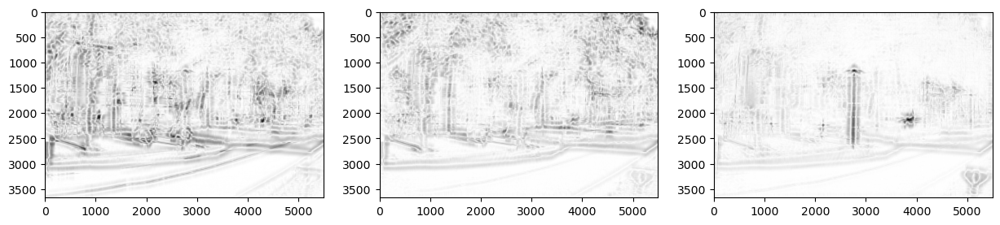

In [230]:
fig, ax = plt.subplots(1,3, figsize=(15,10))
ax[0].imshow(o1, cmap='gray_r')
ax[1].imshow(o2, cmap='gray_r')
ax[2].imshow(o3, cmap='gray_r')

# Check whether SC/CE takes care of lighting problems

In [4]:
ce_full = np.array([np.mean(_x[:,0,0]) for _x in ce_results]) # (color, boxes , center/peripherie)
sc_full = np.array([np.mean(_x[:,0,0]) for _x in sc_results]) # (color, boxes , center/peripherie)
ce_peri_full = np.array([np.mean(_x[:,0,1]) for _x in ce_results]) # (color, boxes , center/peripherie)
sc_peri_full = np.array([np.mean(_x[:,0,1]) for _x in sc_results]) # (color, boxes , center/peripherie)

ce_crops = np.array([np.mean(_x[:,i,0]) for _x in ce_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
sc_crops = np.array([np.mean(_x[:,i,0]) for _x in sc_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
ce_peri_crops = np.array([np.mean(_x[:,i,1]) for _x in ce_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)
sc_peri_crops = np.array([np.mean(_x[:,i,1]) for _x in sc_results for i in range(1, _x.shape[1])]) # (color, boxes , center/peripherie)

In [5]:
jpeg_comp_rate_crops = (np.array(crop_jpeg_factors)[:,:,1] / np.array(crop_jpeg_factors)[:,:,0])#.flatten()

XX,YY = np.meshgrid(np.arange(jpeg_comp_rate_crops.shape[1]),np.arange(jpeg_comp_rate_crops.shape[0]))
crop_index_array = np.vstack((XX.ravel(), YY.ravel())).T
jpeg_comp_rate_crops = jpeg_comp_rate_crops.flatten()

In [6]:
figs = []

In [ ]:
images = []
titles = []
tups = []
for index in range(len(sc_crops)):
    if os.path.exists(os.path.join(basedir, 'oads_arw', 'tiff', filenames[crop_index_array[index][0]])):
        if sc_crops[index] > 1.65:# or ce_crops[index] > 0.009:
            img = Image.open(os.path.join(basedir, 'oads_arw', 'tiff', filenames[crop_index_array[index][0]]))
            crop = img.crop(crop_boxes[crop_index_array[index][1]][crop_index_array[index][0]])
            images.append(crop)
            titles.append(f'{index} sc: {sc_crops[index]:.4f}\nce: {ce_crops[index]:.4f}')
            tups.append((sc_crops[index], ce_crops[index], crop))

fig = plot_images(images=images, titles=titles, max_images=50)
fig.tight_layout()
figs.append(fig)

# fig, ax = plt.subplots(1,1, figsize=(25,25))
# imscatter_all(images=[x[2] for x in tups], xs=[x[0] for x in tups], ys=[x[1] for x in tups], xlabel='SC', ylabel='CE', ax=ax, zoom=0.007)
# figs.append(fig)

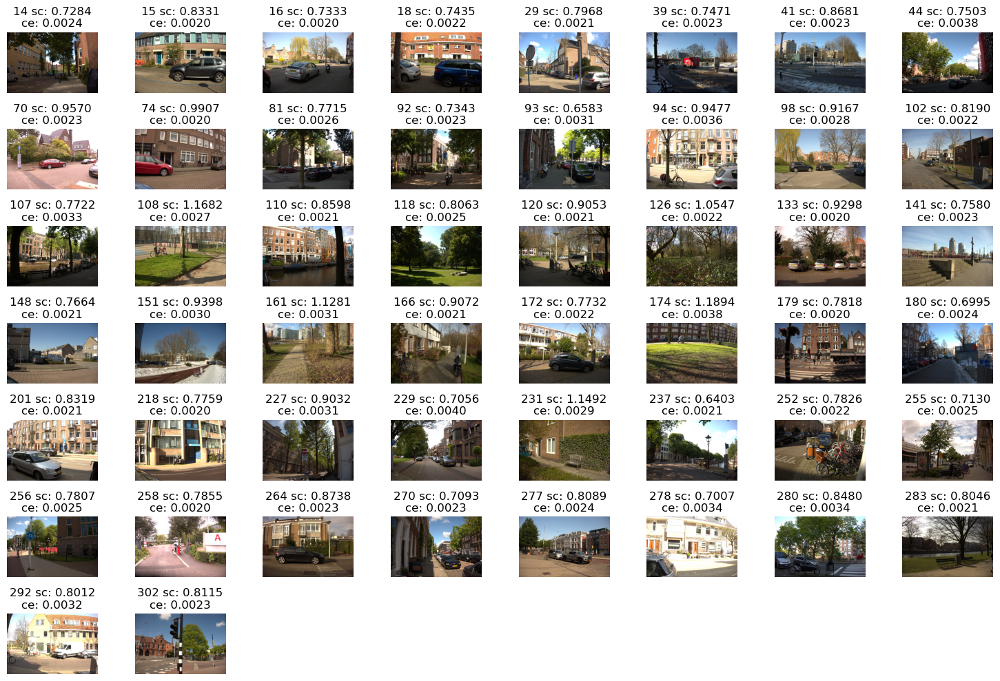

In [70]:
images = []
titles = []
tups = []
for index in range(len(sc_full)):
    if len(images) >= 50:
        break
    if os.path.exists(os.path.join(basedir, 'oads_arw', 'tiff', filenames[index])):
        if ce_full[index] > 0.002: # sc_full[index] > 1.2 or 
            img = Image.open(os.path.join(basedir, 'oads_arw', 'tiff', filenames[index]))
            # crop = img.crop(crop_boxes[index][index])
            images.append(img.reduce(8))
            titles.append(f'{index} sc: {sc_full[index]:.4f}\nce: {ce_full[index]:.4f}')
            tups.append((sc_full[index], ce_full[index], img))

fig = plot_images(images=images, titles=titles, max_images=min((50, len(images))))
fig.tight_layout()
figs.append(fig)

In [6]:
index = 278 # 16332
file_name = filenames[index]
img = Image.open(os.path.join(basedir, 'oads_arw', 'tiff', file_name))

In [14]:
threshold_lgn * 2

array([[5.97746479e-02, 3.79620023e-03, 2.82161730e-03],
       [1.22712254e-02, 1.25484756e-03, 5.92270871e-04],
       [3.18458397e-03, 4.66094694e-04, 1.72976211e-04],
       [9.27300867e-04, 1.36710588e-04, 4.74440029e-05],
       [2.63544436e-04, 3.48652223e-05, 1.26378964e-05],
       [7.29345551e-05, 8.63551939e-06, 2.53105303e-06]])

In [26]:
im = np.array(img)#.reduce(8))
lgn = LGN(config={}, default_config_path='/home/niklas/projects/lgnpy/lgnpy/CEandSC/default_config.yml')
# edge_maps = get_edge_maps(im=im, file_name=file_name, threshold_lgn=threshold_lgn, verbose=False, force_recompute=True, cache=False, result_manager=None, lgn=lgn, results=None, IMTYPE=2, imsize=im.shape[:2])
edge_maps_2 = get_edge_maps(im=im, file_name=file_name, threshold_lgn=threshold_lgn*0.5, verbose=False, force_recompute=True, cache=False, result_manager=None, lgn=lgn, results=None, IMTYPE=2, imsize=im.shape[:2])

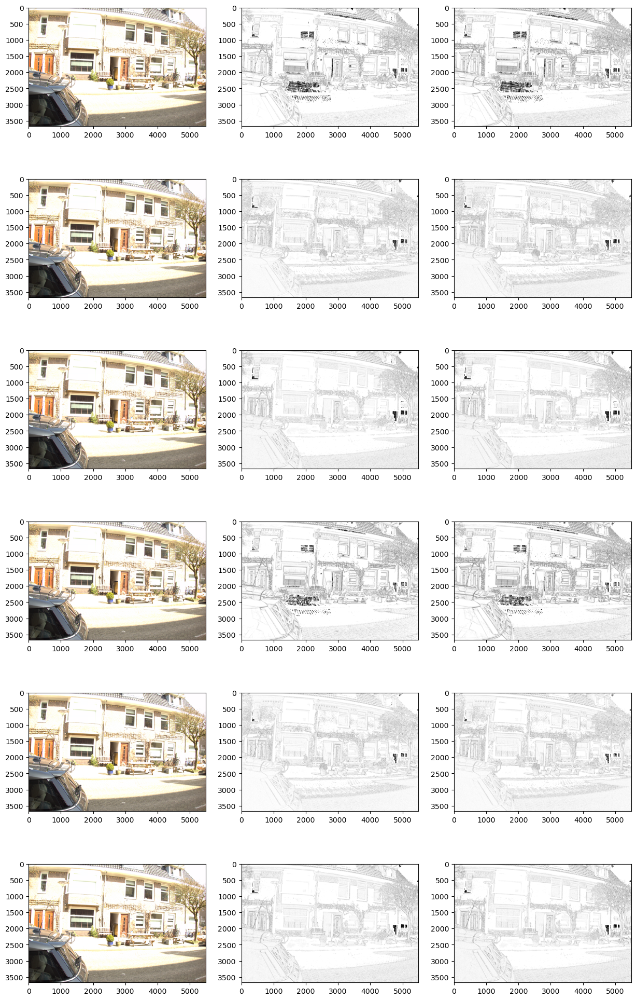

In [27]:
fig, ax = plt.subplots(6,3,figsize=(15,25))
# cmap_rg =LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256)
# cmap_by =LinearSegmentedColormap.from_list('by',["b", "w", "y"], N=256)
# cmaps = ['gray_r', cmap_rg, cmap_by, 'gray_r', cmap_rg, cmap_by]
cmap = 'gray_r'
for ax_index, (edge_map, edge_map_2) in enumerate(zip(edge_maps, edge_maps_2)):
    ax[ax_index, 0].imshow(img) # .reduce(8)
    ax[ax_index, 1].imshow(edge_map, cmap=cmap)
    ax[ax_index, 2].imshow(edge_map_2, cmap=cmap)

plt.show()


In [30]:
oads = OADS_Access(basedir='/home/niklas/projects/data/oads')

In [42]:
[x for x in oads.get_annotation(image_name=file_name[:-5], is_raw=True)['objects'] if x['points']['exterior'][0][0] > 1000]

[{'id': 649271225,
  'classId': 1546190,
  'description': '',
  'geometryType': 'rectangle',
  'labelerLogin': 'WVincken',
  'createdAt': '2021-04-06T14:41:25.205Z',
  'updatedAt': '2021-05-02T08:57:09.669Z',
  'tags': [],
  'classTitle': 'Lamppost',
  'points': {'exterior': [[1038, 178], [1061, 197]], 'interior': []}},
 {'id': 649271230,
  'classId': 1546266,
  'description': '',
  'geometryType': 'rectangle',
  'labelerLogin': 'WVincken',
  'createdAt': '2021-04-06T14:41:36.257Z',
  'updatedAt': '2021-05-02T08:57:09.669Z',
  'tags': [],
  'classTitle': 'Traffic sign',
  'points': {'exterior': [[1350, 342], [1366, 361]], 'interior': []}},
 {'id': 717352805,
  'classId': 1657784,
  'description': '',
  'geometryType': 'rectangle',
  'labelerLogin': 'milenadeswart',
  'createdAt': '2021-05-02T08:56:28.339Z',
  'updatedAt': '2021-05-02T08:57:09.669Z',
  'tags': [],
  'classTitle': 'MASK',
  'points': {'exterior': [[1171, 0], [1373, 262]], 'interior': []}}]

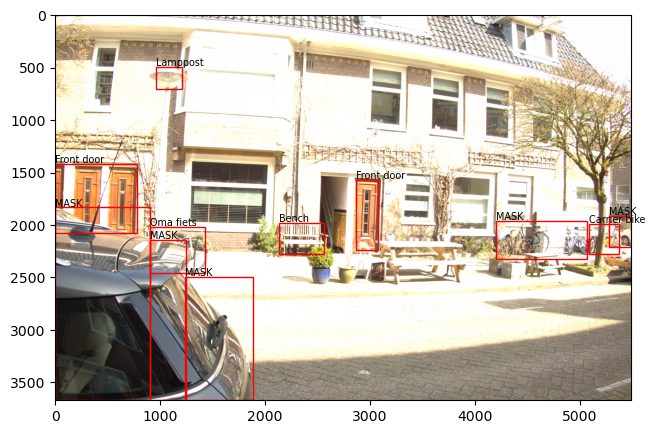

In [77]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.imshow(img)

add_label_boxes_to_axis(ax=ax, label=oads.get_annotation(image_name=file_name[:-5], is_raw=True), add_title=True)

plt.show()